In [1]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision.transforms import Compose, Normalize
from torch.hub import load
import urllib.request

In [2]:
url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg", "dog.jpg")
urllib.request.urlretrieve(url, filename)

('dog.jpg', <http.client.HTTPMessage at 0x16b6ce93170>)

Using cache found in C:\Users\Innomer/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\Innomer/.cache\torch\hub\intel-isl_MiDaS_master


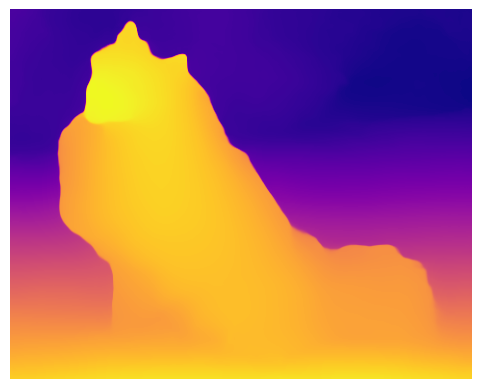

In [5]:
model = load("intel-isl/MiDaS", "DPT_Large")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")

transform = midas_transforms.dpt_transform
# # Transformation for MiDaS input
# def transform(image):
#     return Compose([
#         lambda x: x / 255.0,
#         lambda x: x[:, :, ::-1],  # Convert BGR to RGB
#         lambda x: np.transpose(x, (2, 0, 1)),
#         Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
#         lambda x: torch.from_numpy(x).unsqueeze(0),
#     ])(image)

image_path = 'dog.jpg'
image = cv2.imread(image_path)
input_batch = transform(image).to(device)

with torch.no_grad():
    depth = model(input_batch)

# Post-process the depth map
depth = depth.squeeze().cpu().numpy()
depth_min = depth.min()
depth_max = depth.max()
depth = (depth - depth_min) / (depth_max - depth_min)

# Save or display the depth map
plt.imshow(depth, cmap='plasma')
plt.axis('off')
plt.show()

np.save('depth_map.npy', depth)


In [6]:
import numpy as np
import trimesh
from scipy.spatial import Delaunay

depth_map = np.load('depth_map.npy')

# Create a grid of (x, y) coordinates corresponding to the depth map
h, w = depth_map.shape
x = np.linspace(0, w, w)
y = np.linspace(0, h, h)
x, y = np.meshgrid(x, y)

points_2d = np.vstack((x.flatten(), y.flatten())).T
z = depth_map.flatten()

# Generate the 3D points using the depth as the Z-axis
points_3d = np.vstack((x.flatten(), y.flatten(), z)).T

# Create a triangulation from the 2D grid (Delaunay triangulation)
tri = Delaunay(points_2d)

# Create the 3D mesh from the points and triangles
mesh = trimesh.Trimesh(vertices=points_3d, faces=tri.simplices)

mesh.export('depth_model.obj')

'# https://github.com/mikedh/trimesh\nv 0.00000000 0.00000000 0.12028352\nv 1.00208768 0.00000000 0.12082689\nv 2.00417537 0.00000000 0.12191904\nv 3.00626305 0.00000000 0.12190553\nv 4.00835073 0.00000000 0.12111285\nv 5.01043841 0.00000000 0.12057421\nv 6.01252610 0.00000000 0.11982512\nv 7.01461378 0.00000000 0.11914877\nv 8.01670146 0.00000000 0.11865207\nv 9.01878914 0.00000000 0.11802385\nv 10.02087683 0.00000000 0.11765137\nv 11.02296451 0.00000000 0.11749662\nv 12.02505219 0.00000000 0.11720525\nv 13.02713987 0.00000000 0.11656775\nv 14.02922756 0.00000000 0.11616607\nv 15.03131524 0.00000000 0.11538902\nv 16.03340292 0.00000000 0.11439641\nv 17.03549061 0.00000000 0.11288439\nv 18.03757829 0.00000000 0.11125695\nv 19.03966597 0.00000000 0.10957682\nv 20.04175365 0.00000000 0.10834015\nv 21.04384134 0.00000000 0.10727314\nv 22.04592902 0.00000000 0.10721581\nv 23.04801670 0.00000000 0.10726670\nv 24.05010438 0.00000000 0.10652576\nv 25.05219207 0.00000000 0.10643147\nv 26.05427

c:\Users\Innomer\.conda\envs\gen\Lib\site-packages\pyvista\jupyter\notebook.py:37: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (c:\Users\Innomer\.conda\envs\gen\Lib\site-packages\trame\widgets\__init__.py)

Falling back to a static output.
  warnings.warn(


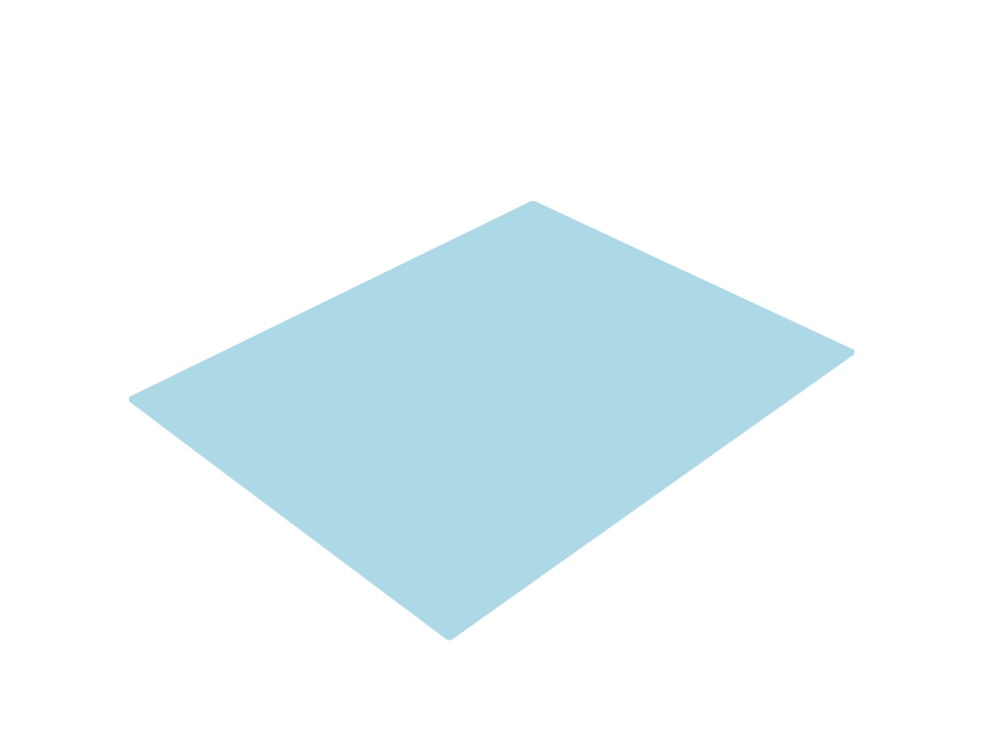

In [8]:
import pyvista as pv
import trimesh

mesh = trimesh.load('depth_model.obj')

plotter = pv.Plotter()

plotter.add_mesh(pv.wrap(mesh.vertices), color="lightblue", show_edges=True)

plotter.show()